In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Garbage, Plastic and Paper bags segmentation

In this project we will use image segmentation to classify and segment garbage, paper and plastic bags.

This  will help us to segregate waste by classifying garbage bags which can be recycled, plastic bags which are not easily dispossable and paper bags which are easily dispossable.



# Install Ultralytics

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.6/865.6 kB 21.0 MB/s eta 0:00:0000:01


# Install required libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from ultralytics import YOLO
import yaml
import random
from PIL import Image

# Set required paths

**traindir - setting path to training data**

**yamlfilepath - setting path to yaml file which consist of labelling of data**

**project_path - path where we will store results**

In [3]:
traindir  = "/kaggle/input/garbase-segmentation/train"
yamlfilepath ="/kaggle/input/garbase-segmentation/data.yaml"
project_path = "/kaggle/working/garbage_segmentation/result"

# Install Ultralytics YOLO V8 model with pretrained weights

In [4]:
model = YOLO('yolov8n-seg.yaml')  # build a new model from YAML
model = YOLO('yolov8n-seg.pt') # load a pretrained model (recommended for training)

100%|██████████| 6.74M/6.74M [00:00<00:00, 113MB/s]


# Install required dependecies to train YOLOV8 model

In [ ]:
!pip3 uninstall wandb --yes


In [ ]:
pip install -U ipywidgets

# Train YOLO v8 model on garbage bag segmentation data

**Train yolov8 segmentation model on garbage, plastic and paper bags dataset with 50 epochs, batch size 4, patience 5 and image-size as 640.**

In [ ]:
result= model.train(data=yamlfilepath, project=project_path, epochs=50, patience=5, batch=4, imgsz=640)

# set the model path to best weights of trained model

In [5]:
my_new_model = YOLO('/kaggle/input/garbage_segmentation_model/other/segment-50/1/last.pt')

# Perform prediction on test images to segment garbage bags and save result.

In [6]:
new_image = '/kaggle/input/plastic-paper-garbage-bag-synthetic-images/ImageClassesCombinedWithCOCOAnnotations/test_image.jpg'

new_result = my_new_model(new_image, conf=0.2, save=True, save_crop=True, project="/kaggle/working/runs/detect", name="inference", exist_ok=True)


image 1/1 /kaggle/input/plastic-paper-garbage-bag-synthetic-images/ImageClassesCombinedWithCOCOAnnotations/test_image.jpg: 448x640 3 garbages, 3 plastics, 86.1ms
Speed: 11.0ms preprocess, 86.1ms inference, 255.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /kaggle/working/runs/detect/inference


# Prediction on test image

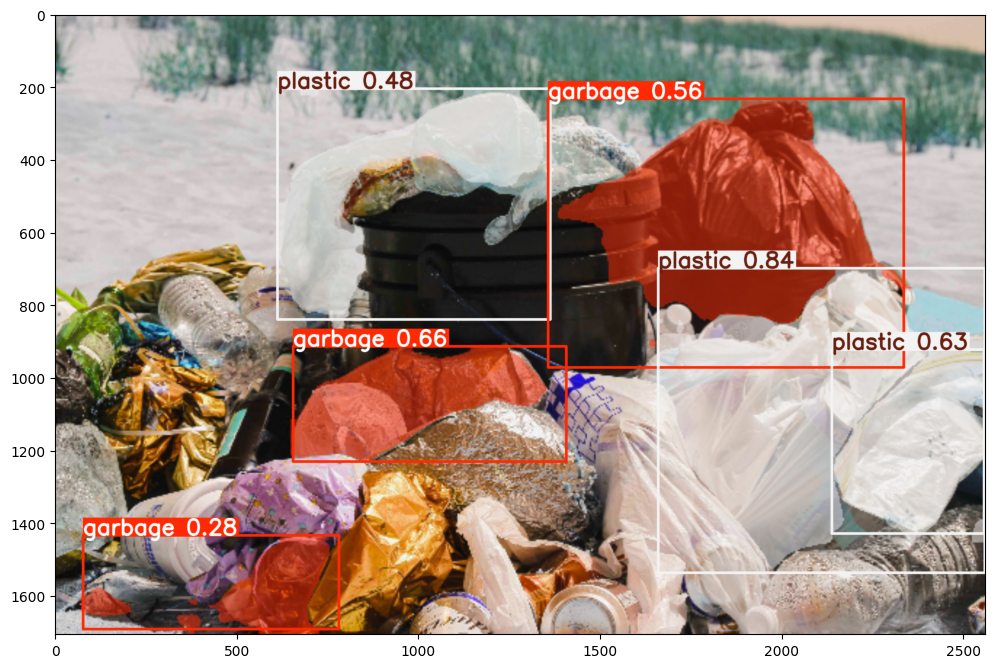

In [7]:
new_result_array = new_result[0].plot()
plt.figure(figsize=(12, 15))
plt.imshow(new_result_array)

In [ ]:
rm -rf /kaggle/working/runs

# Run prediction on test videos and save output

In [7]:
import shutil
videoPath = '/kaggle/input/garbage-seg-vid/istockphoto-473137195-640_adpp_is.mp4'

my_new_model.predict(source=videoPath, save=True, show_boxes=True, show_labels=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/493) /kaggle/input/garbage-seg-vid/istockphoto-473137195-640_adpp_is.mp4: 384x640 1 plastic, 102.3ms
video 1/1 (frame 2/493) /kaggle/input/garbage-seg-vid/istockphoto-473137195-640_adpp_is.mp4: 384x640 1 plastic, 8.3ms
video 1/1 (frame 3/493) /kaggle/input/garbage-seg-vid/istockphoto-473137195-640_adpp_is.mp4: 384x640 1 plastic, 8.0ms
video 1/1 (frame 4/493) /kaggle/input/garbage-seg-vid/istockphoto-473137195-640_adpp_is.mp4: 384x640

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'garbage', 1: 'paper', 2: 'plastic'}
 obb: None
 orig_img: array([[[207, 176, 131],
         [207, 176, 131],
         [207, 176, 131],
         ...,
         [255, 227, 178],
         [255, 227, 178],
         [255, 227, 178]],
 
        [[207, 176, 131],
         [207, 176, 131],
         [207, 176, 131],
         ...,
         [255, 227, 178],
         [255, 227, 178],
         [255, 227, 178]],
 
        [[207, 176, 131],
         [207, 176, 131],
         [207, 176, 131],
         ...,
         [255, 228, 179],
         [255, 227, 178],
         [255, 227, 178]],
 
        ...,
 
        [[ 76, 105, 135],
         [ 75, 104, 134],
         [ 76, 105, 135],
         ...,
         [108, 142, 141],
         [104, 157, 170],
         [113, 166, 179]],
 
        [[ 80, 105, 135],
         [ 78, 103, 13

In [16]:
import subprocess
from IPython.display import Video

# Convert AVI to MP4 using FFmpeg
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/kaggle/working/runs/detect/inference/istockphoto-473137195-640_adpp_is.avi', '/kaggle/working/runs/detect/inference/istockphoto-473137195-640_adpp_is.mp4'])


# Display the converted MP4 video
Video("/kaggle/working/runs/detect/inference/istockphoto-473137195-640_adpp_is.mp4", embed=True, width=960)

In [11]:
import shutil
videoPath = '/kaggle/input/garbage-seg-vid/istockphoto-1475351906-640_adpp_is.mp4'

my_new_model.predict(source=videoPath, save=True, show_boxes=True, show_labels=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/595) /kaggle/input/garbage-seg-vid/istockphoto-1475351906-640_adpp_is.mp4: 384x640 2 plastics, 9.0ms
video 1/1 (frame 2/595) /kaggle/input/garbage-seg-vid/istockphoto-1475351906-640_adpp_is.mp4: 384x640 2 plastics, 7.7ms
video 1/1 (frame 3/595) /kaggle/input/garbage-seg-vid/istockphoto-1475351906-640_adpp_is.mp4: 384x640 2 plastics, 7.7ms
video 1/1 (frame 4/595) /kaggle/input/garbage-seg-vid/istockphoto-1475351906-640_adpp_is.mp4: 38

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'garbage', 1: 'paper', 2: 'plastic'}
 obb: None
 orig_img: array([[[53, 37, 29],
         [53, 37, 29],
         [54, 38, 30],
         ...,
         [65, 45, 35],
         [65, 45, 35],
         [66, 46, 36]],
 
        [[53, 37, 29],
         [53, 37, 29],
         [54, 38, 30],
         ...,
         [65, 45, 35],
         [67, 47, 37],
         [68, 48, 38]],
 
        [[53, 37, 29],
         [53, 37, 29],
         [54, 38, 30],
         ...,
         [67, 47, 37],
         [68, 48, 38],
         [66, 46, 36]],
 
        ...,
 
        [[72, 43, 14],
         [75, 46, 17],
         [81, 52, 23],
         ...,
         [76, 50, 18],
         [71, 45, 13],
         [72, 46, 14]],
 
        [[73, 44, 15],
         [73, 44, 15],
         [73, 44, 15],
         ...,
         [85, 59, 27],
         [89, 

In [13]:
import subprocess
from IPython.display import Video

# Convert AVI to MP4 using FFmpeg
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/kaggle/working/runs/detect/inference/istockphoto-1475351906-640_adpp_is.avi', '/kaggle/working/runs/detect/inference/istockphoto-1475351906-640_adpp_is.mp4'])


# Display the converted MP4 video
Video("/kaggle/working/runs/detect/inference/istockphoto-1475351906-640_adpp_is.mp4", embed=True, width=960)

In [14]:
import shutil
videoPath = '/kaggle/input/garbage-seg-vid/istockphoto-1092265372-640_adpp_is.mp4'

my_new_model.predict(source=videoPath, save=True, show_boxes=True, show_labels=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/290) /kaggle/input/garbage-seg-vid/istockphoto-1092265372-640_adpp_is.mp4: 384x640 1 garbage, 8.6ms
video 1/1 (frame 2/290) /kaggle/input/garbage-seg-vid/istockphoto-1092265372-640_adpp_is.mp4: 384x640 1 garbage, 7.9ms
video 1/1 (frame 3/290) /kaggle/input/garbage-seg-vid/istockphoto-1092265372-640_adpp_is.mp4: 384x640 1 garbage, 8.1ms
video 1/1 (frame 4/290) /kaggle/input/garbage-seg-vid/istockphoto-1092265372-640_adpp_is.mp4: 384x6

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'garbage', 1: 'paper', 2: 'plastic'}
 obb: None
 orig_img: array([[[182, 172, 158],
         [204, 194, 180],
         [200, 190, 176],
         ...,
         [228, 228, 226],
         [227, 227, 225],
         [225, 225, 223]],
 
        [[179, 169, 155],
         [206, 196, 182],
         [202, 192, 178],
         ...,
         [227, 227, 225],
         [225, 225, 223],
         [224, 224, 222]],
 
        [[175, 165, 151],
         [211, 201, 187],
         [207, 197, 183],
         ...,
         [224, 224, 222],
         [224, 224, 222],
         [223, 223, 221]],
 
        ...,
 
        [[103, 123, 125],
         [110, 130, 132],
         [ 91, 109, 111],
         ...,
         [ 22,  25,  25],
         [ 22,  25,  25],
         [ 22,  25,  25]],
 
        [[ 92, 112, 114],
         [ 93, 113, 11

In [15]:
import subprocess
from IPython.display import Video

# Convert AVI to MP4 using FFmpeg
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/kaggle/working/runs/detect/inference/istockphoto-1092265372-640_adpp_is.avi', '/kaggle/working/runs/detect/inference/istockphoto-1092265372-640_adpp_is.mp4'])


# Display the converted MP4 video
Video("/kaggle/working/runs/detect/inference/istockphoto-1092265372-640_adpp_is.mp4", embed=True, width=960)